# Problem Statement 

## A pharmaceutical company, needs to develop a model that predicts whether a patient will be diagnosed with diabetes. The model needs to have an accuracy score greater than 0.85.


In [21]:
# Importing the Necessary libraries

import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV



In [22]:
# Import the required Data

df = pd.read_csv('https://bit.ly/DiabetesDS')

In [23]:
# Preview the first 5 records
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [24]:
# Check the Describe Statistics

df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [25]:
#Check for Missing Data
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [26]:
# Check for Data types
df.dtypes

Pregnancies                   int64
Glucose                       int64
BloodPressure                 int64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


## Observations

### There are no missing Values but 	Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin and 	BMI have zero values that need to be replaced with their respective median

In [28]:
#Replacing the Zero Values with Mean

df['Pregnancies'].replace(to_replace = 0, value = df['Pregnancies'].mean(), inplace=True)
df['Glucose'].replace(to_replace = 0, value = df['Glucose'].mean(), inplace=True)
df['BloodPressure'].replace(to_replace = 0, value = df['BloodPressure'].mean(), inplace=True)
df['SkinThickness'].replace(to_replace = 0, value = df['SkinThickness'].mean(), inplace=True)
df['Insulin'].replace(to_replace = 0, value = df['Insulin'].mean(), inplace=True)
df['BMI'].replace(to_replace = 0, value = df['BMI'].mean(), inplace=True)


In [29]:
# Confirm that the Zero entries are gone on the Data Frame
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,4.400782,121.681605,72.254807,26.606479,118.660163,32.450805,0.471876,33.240885,0.348958
std,2.984162,30.436016,12.115932,9.631241,93.080358,6.875374,0.331329,11.760232,0.476951
min,1.000000,44.000000,24.000000,7.000000,14.000000,18.200000,0.078000,21.000000,0.000000
25%,2.000000,99.750000,64.000000,20.536458,79.799479,27.500000,0.243750,24.000000,0.000000
50%,3.845052,117.000000,72.000000,23.000000,79.799479,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


[CV] END max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2; total tim

[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples

<AxesSubplot:>

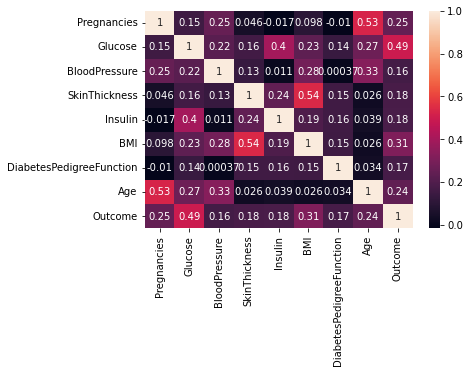

In [30]:
# Performing Data Exploration
import seaborn as sns
corr = df.corr()
sns.heatmap(corr,annot= True,
            xticklabels=corr.columns,
            yticklabels=corr.columns)

In [31]:
# Prepare the features

X = df.drop('Outcome', axis = 1)
y = df['Outcome']


# Splitting the Data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state = 42, stratify= y)

'''from sklearn.preprocessing import MinMaxScaler
mc_X = MinMaxScaler().fit(X_train)
X_train = mc_X.transform(X_train)
X_test = mc_X.transform(X_test)'''

'from sklearn.preprocessing import MinMaxScaler\nmc_X = MinMaxScaler().fit(X_train)\nX_train = mc_X.transform(X_train)\nX_test = mc_X.transform(X_test)'

In [32]:
#Data Modelling using Decision Trees, Random Forests and Logistic Regression

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

# Instatiating the Models with the default parameters

Decision_Tree_Classifier = DecisionTreeClassifier(random_state=42)
Random_Forest_Classifier = RandomForestClassifier(random_state=42)
Logistic_Regression_Classifier = LogisticRegression(random_state=42 , max_iter= 1000)
#Fit the Models

Decision_Tree_Classifier.fit(X_train,y_train)
Random_Forest_Classifier.fit(X_train,y_train)
Logistic_Regression_Classifier.fit(X_train,y_train)

#Create the Predictors

dec_predictor = Decision_Tree_Classifier.predict(X_train)
rand_predictor = Random_Forest_Classifier.predict(X_train)
log_predictor = Logistic_Regression_Classifier.predict(X_train)

test_dec_predictor = Decision_Tree_Classifier.predict(X_test)
test_rand_predictor = Random_Forest_Classifier.predict(X_test)
test_log_predictor = Logistic_Regression_Classifier.predict(X_test)

In [33]:
#Checking on Model Accuracy
print('Accuracy')
print('Decision Tree Accuracy', accuracy_score(dec_predictor,y_train))
print('Random Tree Accuracy', accuracy_score(rand_predictor,y_train))
print('Logistic Regression Accuracy', accuracy_score(log_predictor,y_train))

print('Decision Tree Test Accuracy', accuracy_score(test_dec_predictor,y_test))
print('Random Tree Test Accuracy', accuracy_score(test_rand_predictor,y_test))
print('Logistic Regression Test Accuracy', accuracy_score(test_log_predictor,y_test))

Accuracy
Decision Tree Accuracy 1.0
Random Tree Accuracy 1.0
Logistic Regression Accuracy 0.7914338919925512
Decision Tree Test Accuracy 0.7012987012987013
Random Tree Test Accuracy 0.7489177489177489
Logistic Regression Test Accuracy 0.7359307359307359


In [34]:
#Hyper parameter Tuning for Random Forest Classifier
param_grid = { 
    #'n_estimators': [100,200,300, 500],
    #'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [1,2,3,4,5]
    #'criterion' :['gini', 'entropy']
    
}

clf = GridSearchCV(Random_Forest_Classifier, param_grid = param_grid, cv = 10, verbose=True, n_jobs=-1)
best_clf = clf.fit(X_train,y_train)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


In [35]:
#Checking Accuracy
Cv_predictor = clf.predict(X_train)
Test_Cv_predictor = clf.predict(X_test)
print('Cv_RFC', accuracy_score(Cv_predictor,y_train))
print('Test RFC', accuracy_score(Test_Cv_predictor,y_test))


Cv_RFC 0.8324022346368715
Test RFC 0.7489177489177489


In [38]:
# Hyper parameter Tuning for Logistic Regression

import numpy as np

from sklearn.model_selection import GridSearchCV
logModel = LogisticRegression(random_state=42, max_iter=1000)
param_grid = [    
    {'penalty' : ['l1', 'l2', 'elasticnet', 'none'],
    'C' : np.logspace(-4, 4, 20),
    'solver' : ['lbfgs','newton-cg','liblinear','sag','saga'],
    'max_iter' : [100, 1000,2500, 5000]
    
    }
]

clf = GridSearchCV(logModel, param_grid = param_grid, cv = 3, verbose=False, n_jobs=-1)
best_clf = clf.fit(X_train,y_train)




/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_l

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_l

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_l

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ugalugalu/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ugalugalu/opt/anaconda3

In [39]:
# Using the best Params

Log_predictor  = best_clf.predict(X_test)
print('Logistic Regression Accuracy', accuracy_score(Log_predictor,y_test))

Logistic Regression Accuracy 0.7445887445887446


In [43]:
# Hyper parameter Tuning for Decision Tree Classifier

# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(1, 4, endpoint=True)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2,6,8,10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1,2,3,4]


model = DecisionTreeClassifier(random_state=42)
from sklearn.model_selection import RandomizedSearchCV
random_grid = {#'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}
                 
    
DT_clf = RandomizedSearchCV(model, param_distributions=  random_grid, cv = 100,verbose=2, n_jobs=-1,n_iter = 1000)
bestest_clf = DT_clf.fit(X_train,y_train)

Fitting 100 folds for each of 1000 candidates, totalling 100000 fits
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, 

[CV] END max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_s

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total tim

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_

[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=12, max_features=auto, min_samples_leaf=3, min_samples

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total tim

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total tim

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total tim

[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total tim

[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10;

[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total tim

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total t

[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10;

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total tim

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total 

[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total tim

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=10;

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total tim

[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10;

[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total tim

[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; 

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total tim

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total tim

[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total tim

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=2; total tim

[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=6; total tim

[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total tim

[CV] END max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; tot

[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; tota

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10; to

[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total tim

[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total tim

[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=3,

[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total tim

[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total tim

[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=10;

[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10;

[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total tim

[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10;

[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10;

[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10;

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total tim

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total tim

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total tim

[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total tim

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total tim

[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10;

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total tim

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total tim

[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=6; total tim

[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total tim

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total tim

[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; t

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total tim

[CV] END max_depth=None, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_spl

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10;

[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=

[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=4, min_sa

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2; total tim

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10;

[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=2; total ti

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total tim

[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total tim

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10;

[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=8; total tim

[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=2; total tim

[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; t

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total tim

[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=10;

[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10;


[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2; total ti

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total tim

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=6; total tim

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10;

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total tim

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=10;

[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=4, min_samples_split=6; total tim

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total tim

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total tim

[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=2; total tim

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10;

[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total tim

[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total tim


[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=10

[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=2; total tim

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; tot

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=10;

[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total tim

[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=6; total tim

[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=10; 

[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6; total tim

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total tim

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10; tot

[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=8; total tim

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2; total tim

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total tim

[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10;

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10;

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=10; tot

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total tim

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10;

[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=3, min_samples_split=10;

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=10; total ti

[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total tim

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total tim

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8; total tim

[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8; total tim

[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; 

[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=2; total tim

[CV] END max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2; total tim

[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6; total tim

[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; tota

[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total tim

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6; total tim

[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2; total tim

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total tim

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=10; total ti

[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=10;

[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2; total tim

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=2, min_samples_split=2; to

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=8; total tim

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total tim

[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=6; total tim

[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8; total tim

[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=6; total tim

[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=auto, min_samples_leaf=1, min_samples_split=8; total tim

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=10; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total ti

[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=6; total tim

[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total tim

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total tim

In [44]:
 DT_predictor = bestest_clf.predict(X_test)
print(DT_clf.best_params_)
print(accuracy_score(DT_predictor,y_test))

{'min_samples_split': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 4}
0.7532467532467533


In [45]:
# Trial with a loop to check the Maximum Depth

for depth in range(1, 20):
    model = DecisionTreeClassifier(random_state=42, max_depth=depth)
    model.fit(X_train, y_train)
    predictions_valid = model.predict(X_test)
    print('max_depth =', depth, ': ', end='')
    print(accuracy_score(y_test, predictions_valid))
    


max_depth = 1 : 0.6926406926406926
max_depth = 2 : 0.7272727272727273
max_depth = 3 : 0.7229437229437229
max_depth = 4 : 0.7835497835497836
max_depth = 5 : 0.7662337662337663
max_depth = 6 : 0.7142857142857143
max_depth = 7 : 0.7186147186147186
max_depth = 8 : 0.7056277056277056
max_depth = 9 : 0.7142857142857143
max_depth = 10 : 0.7056277056277056
max_depth = 11 : 0.7012987012987013
max_depth = 12 : 0.7142857142857143
max_depth = 13 : 0.7056277056277056
max_depth = 14 : 0.7012987012987013
max_depth = 15 : 0.7012987012987013
max_depth = 16 : 0.7012987012987013
max_depth = 17 : 0.7012987012987013
max_depth = 18 : 0.7012987012987013
max_depth = 19 : 0.7012987012987013


In [46]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=8; total tim

[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END max_depth=1, max_features=sqrt, min_samples_leaf=2, min_samples_split=8; total tim

In [47]:
print(classification_report(y_test, DT_predictor))

              precision    recall  f1-score   support

           0       0.76      0.91      0.83       150
           1       0.73      0.47      0.57        81

    accuracy                           0.75       231
   macro avg       0.75      0.69      0.70       231
weighted avg       0.75      0.75      0.74       231



In [48]:
print(classification_report(y_test, Log_predictor))

              precision    recall  f1-score   support

           0       0.77      0.87      0.82       150
           1       0.68      0.52      0.59        81

    accuracy                           0.74       231
   macro avg       0.72      0.69      0.70       231
weighted avg       0.74      0.74      0.74       231



In [50]:
print(classification_report(y_test, Test_Cv_predictor))

              precision    recall  f1-score   support

           0       0.77      0.88      0.82       150
           1       0.69      0.51      0.59        81

    accuracy                           0.75       231
   macro avg       0.73      0.69      0.70       231
weighted avg       0.74      0.75      0.74       231



# Conclusion

## Based on the Hyper parameters Tuning Done, The best Model to Pick is The Decision Tree Classifier. I did not get to the Target of 85% Accuracy, I believe I could have achieved this with Feature Engineering which is out of scope for this project